In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy
import scipy.io.wavfile
from IPython.display import Audio

### 音效試聽

In [2]:
Audio('bird.wav')

### 讀取音效資料
* rate: 取樣次數(Hz)
* data: ndarray(np.int16) shape (X, 2) 雙聲道

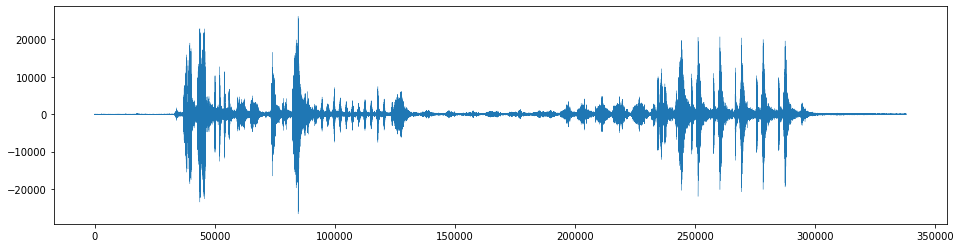

In [3]:
rate, data = scipy.io.wavfile.read('bird.wav')

plt.figure(figsize=(16, 4))
plt.plot(data.mean(1), lw=0.3)

### 直接修改取樣率更改速度 會變更到頻率
* speed down - frequency down
* speed up   - frequency up 

#### 變成低頻的熱帶雨林鳥

In [4]:
scipy.io.wavfile.write('bird2.wav', rate//2, data)
Audio('bird2.wav')

### 把音訊切片成小片段 擷取部份來播放
* 鳥類頻率約1000hz~3000hz
* 波形約 20 array

In [5]:
# speed X
X = 2 # 倍數
n = 2 # n 切片的大小
d = round(n * (X-1) / X) # d 要刪除的量
print('d:', d)
data2 = data[:n * (data.shape[0] // n)] # 資料先取小於data數的最大n倍數
data2 = data2.reshape((-1, n, 2)) # 切分成多個n-array的片段
data2 = data2[:, 0:n-d, :].reshape((-1, 2)) # 切掉最後一個筆資料

d: 1


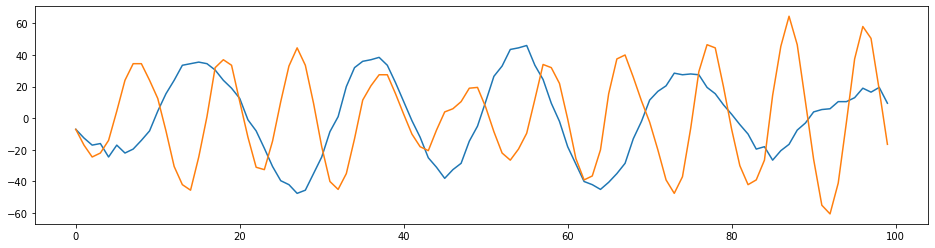

In [6]:
# n 太小 本質上還是改變了頻率
plt.figure(figsize=(16, 4))
plt.plot(data.mean(1)[:100], lw=1.5)
plt.plot(data2.mean(1)[:100], lw=1.5)

#### 本質上變成取樣頻率變高 特別在高倍數下

In [7]:
scipy.io.wavfile.write('bird2.wav', rate, data2)
Audio('bird2.wav')

### 將切片的音訊片段 "部份"重疊播放 在交接處用梯形window func 做平滑的連結 保留所有頻率資料
* 例如一句話把 將每個字切為片段 並重疊播放 在重疊處漸大漸小！

In [8]:
# 梯形window func
def trapezoid(size, t):
    arr = np.ones(size)
    ar = np.linspace(0, 1, t+2)[1:-1]
    arr[:t] = ar * arr[:t]
    arr[-t:] = ar[::-1] * arr[-t:]
    
    return arr

(-0.1, 1.2)

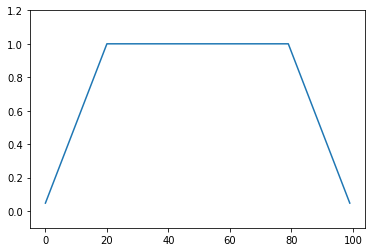

In [9]:
plt.plot(trapezoid(100, 20))
plt.ylim((-0.1, 1.2))

### 重疊處平滑處理(要重疊處理的資料要非0~1, 是 $\frac{1}{n+1}~\frac{n}{n+1}$, n是重疊資料數 )

(-0.1, 1.2)

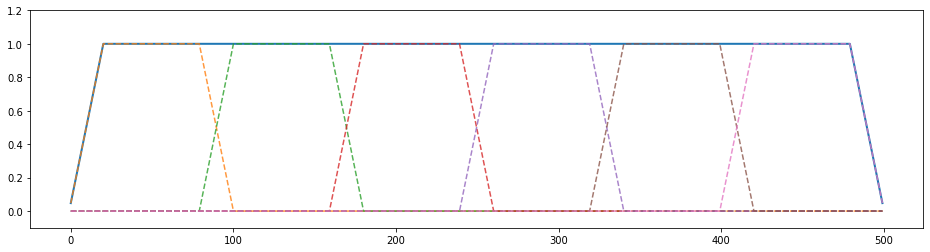

In [10]:
n = 100
d = 20
s = 6
arr = np.zeros((s * (n - d) + d) * s).reshape(s * (n - d) + d, s)
for i in range(s):
    arr[i*(n-d):i*(n-d)+n, i] = trapezoid(n ,d)

plt.figure(figsize=(16, 4))
plt.plot(arr.sum(1), lw=2)
plt.plot(arr, '--', lw=1.5, alpha=0.8)
plt.ylim((-0.1, 1.2))

In [11]:
# speed X
X = 2 # 倍數
n = 6000 # n 切片的大小 (這種方式 n 不適合太小, )
d = round(n * (X-1) / X) # d 要刪除的量
print('d:', d)
data2 = data[:n * (data.shape[0] // n)] # 資料先取小於data數的最大n倍數
data2 = data2.reshape((-1, n, 2)) # 切分成多個n-array的片段
data2 = data2 * trapezoid(n, d)[:, np.newaxis] # 創造二聲道的新軸 使用window func
data2[1:, :d] = data2[1:, :d] + data2[:-1, -d:] # 處理重疊部份
data2 = data2[:, :-d].reshape((-1, 2)).astype(np.int16) #


d: 3000


### 有較好的聽覺

In [12]:
scipy.io.wavfile.write('bird2.wav', rate, data2)
Audio('bird2.wav')

### 利用提高取樣率來提高速度(頻率變高)

In [13]:
scipy.io.wavfile.write('bird2.wav', int(rate*1.5), data)
Audio('bird2.wav')

### 原始音律

In [14]:
Audio('bird.wav')

## !!! 可是此方法最高速度為2倍 (但是功能可以相疊)

# 語音測試

### 原始音律

In [15]:
Audio('mayday.wav')

In [16]:
rate, data = scipy.io.wavfile.read('mayday.wav')

# speed X
X = 1.5 # 倍數
n = 6000 # n 切片的大小 (這種方式 n 要找到適合太小 太大太小都不好)
d = round(n * (X-1) / X) # d 要刪除的量
print('d:', d)
data2 = data[:n * (data.shape[0] // n)] # 資料先取小於data數的最大n倍數
data2 = data2.reshape((-1, n, 2)) # 切分成多個n-array的片段
data2 = data2 * trapezoid(n, d)[:, np.newaxis] # 創造二聲道的新軸 使用window func
data2[1:, :d] = data2[1:, :d] + data2[:-1, -d:] # 重疊的部份相加
data2 = data2[:, :-d].reshape((-1, 2)).astype(np.int16) # 取需要的部份 並轉np.int16

scipy.io.wavfile.write('mayday2.wav', rate, data2)
Audio('mayday2.wav')

d: 2000


### 利用提高取樣率來提高速度(頻率變高)

In [17]:
scipy.io.wavfile.write('mayday2.wav', round(rate*1.5), data)
Audio('mayday2.wav')

### 3倍 (1.5 * 2)效果疊加

In [18]:
# speed X
X = 1.5 # 倍數
# n = 6000
d = round(n * (X-1) / X) # d 要刪除的量
print('d:', d)
data2 = data2[:n * (data2.shape[0] // n)] # 資料先取小於data數的最大n倍數
data2 = data2.reshape((-1, n, 2)) # 切分成多個n-array的片段
data2 = data2 * trapezoid(n, d)[:, np.newaxis] # 創造二聲道的新軸 使用window func
data2[1:, :d] = data2[1:, :d] + data2[:-1, -d:]
data2 = data2[:, :-d].reshape((-1, 2)).astype(np.int16)

scipy.io.wavfile.write('mayday2.wav', rate, data2)
Audio('mayday2.wav')

d: 2000
